<a href="https://colab.research.google.com/github/Nieva97/amps_TFM/blob/main/prueba_v5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow


# Upload data.
from google.colab import files
data = files.upload()

In [3]:
#prueba de mediaPipe
!pip install mediapipe

import mediapipe as mp
mp_face_detection = mp.solutions.face_detection
# Prepare DrawingSpec for drawing the face landmarks later.
mp_drawing = mp.solutions.drawing_utils 
drawing_spec = mp_drawing.DrawingSpec(thickness=1, circle_radius=1)

help(mp_face_detection.FaceDetection)

DESIRED_HEIGHT = 480
DESIRED_WIDTH = 480
def resize_and_show(image):
  h, w = image.shape[:2]
  if h < w:
    img = cv2.resize(image, (DESIRED_WIDTH, math.floor(h/(w/DESIRED_WIDTH))))
  else:
    img = cv2.resize(image, (math.floor(w/(h/DESIRED_HEIGHT)), DESIRED_HEIGHT))
  #cv2_imshow(img)

Help on class FaceDetection in module mediapipe.python.solutions.face_detection:

class FaceDetection(mediapipe.python.solution_base.SolutionBase)
 |  FaceDetection(min_detection_confidence=0.5, model_selection=0)
 |  
 |  MediaPipe Face Detection.
 |  
 |  MediaPipe Face Detection processes an RGB image and returns a list of the
 |  detected face location data.
 |  
 |  Please refer to
 |  https://solutions.mediapipe.dev/face_detection#python-solution-api
 |  for usage examples.
 |  
 |  Method resolution order:
 |      FaceDetection
 |      mediapipe.python.solution_base.SolutionBase
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, min_detection_confidence=0.5, model_selection=0)
 |      Initializes a MediaPipe Face Detection object.
 |      
 |      Args:
 |        min_detection_confidence: Minimum confidence value ([0.0, 1.0]) for face
 |          detection to be considered successful. See details in
 |          https://solutions.mediapipe.dev/face_det

[label_id: 0
score: 0.9572702646255493
location_data {
  format: RELATIVE_BOUNDING_BOX
  relative_bounding_box {
    xmin: 0.3032076954841614
    ymin: 0.3541549742221832
    width: 0.24104028940200806
    height: 0.32138702273368835
  }
  relative_keypoints {
    x: 0.37297192215919495
    y: 0.4438694417476654
  }
  relative_keypoints {
    x: 0.4731198847293854
    y: 0.44873490929603577
  }
  relative_keypoints {
    x: 0.42133575677871704
    y: 0.5238316059112549
  }
  relative_keypoints {
    x: 0.41952940821647644
    y: 0.5845073461532593
  }
  relative_keypoints {
    x: 0.31591176986694336
    y: 0.46355095505714417
  }
  relative_keypoints {
    x: 0.5310295224189758
    y: 0.4741653501987457
  }
}
]


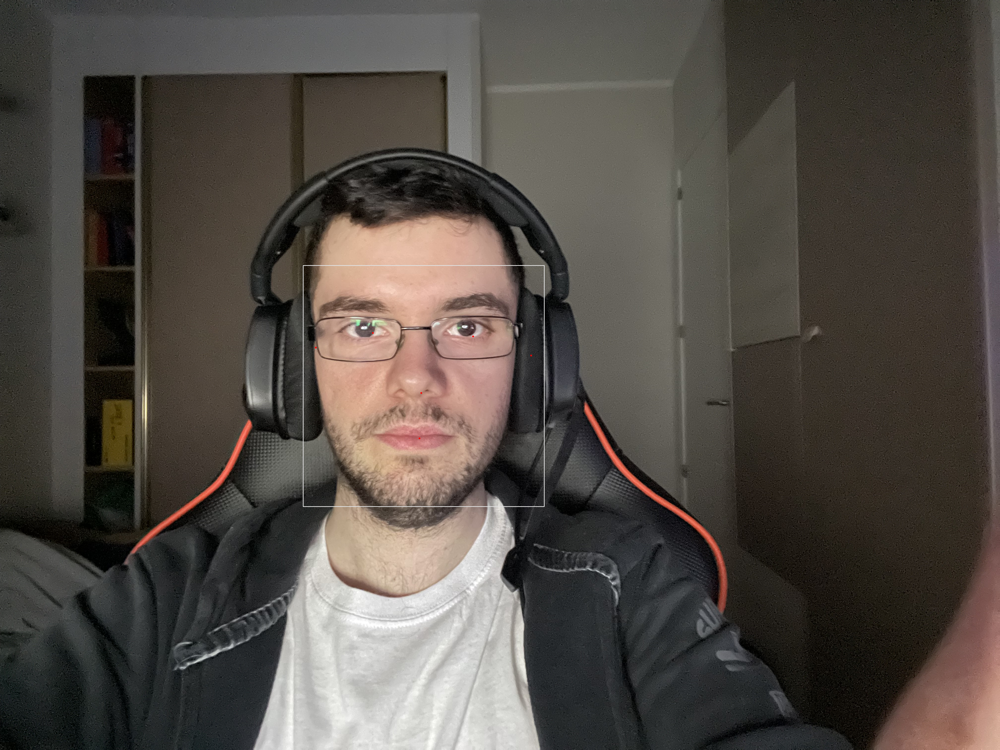

In [ ]:
img_color = cv2.imread('itsme.jpg',cv2.IMREAD_COLOR)
#cv2_imshow(img_color)
resize_and_show(img_color)
with mp_face_detection.FaceDetection(
    min_detection_confidence=0.5, model_selection=0) as face_detection:
    # Convert the BGR image to RGB and process it with MediaPipe Face Detection.
    results = face_detection.process(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB))
    print(results.detections)
    # Draw face detections of each face.
    if results.detections:
      annotated_image = img_color.copy()
      for detection in results.detections:
        mp_drawing.draw_detection(annotated_image, detection)
      cv2_imshow(annotated_image)

  


In [4]:
# Create a video capture object, in this case we are reading the video from a file
# vid_capture = cv2.VideoCapture('cam3.avi')
vid_capture = cv2.VideoCapture('MOV_2700.mp4')
# name_saveas = "tum_kitchen_ID_00_cam3.txt"
name_saveas = "doblar_ropa_MOV_2700.txt"

#Variables auxiliares
i=0
detection_counter=0

#Bucle principal
while(vid_capture.isOpened()):
  # vid_capture.read() methods returns a tuple, first element is a bool
  # and the second is frame
  with mp_face_detection.FaceDetection(
    min_detection_confidence=0.5, model_selection=1) as face_detection:
    #-Minimum confidence value ([0.0, 1.0]) from the face detection model for the 
    #detection to be considered successful. Default to 0.5.
    #-Model_selection: An integer index 0 or 1. Use 0 to select a short-range 
    #model that works best for faces within 2 meters from the camera, and 1 for 
    #a full-range model best for faces within 5 meters.
    ret, frame = vid_capture.read()
    if ret == True:
      width, height, info = frame.shape
      resize_and_show(frame)
      results = face_detection.process(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
      i+= 1
      row = 'figure_' + str(i)
      # print(row)
      if not results.detections:
        # Esquina superior, coor X
        xleft_top = 0
        # Esquina superior, coor Y
        yleft_top = 0
        # Esquina inferior, coor X
        xright_bot = 0       
        # Esquina inferior, coor Y
        yright_bot = 0
      else:
        #print(results.detections)
        annotated_image = frame.copy()
        for detection in results.detections:

          # Draw & show results
          """mp_drawing.draw_detection(annotated_image, detection)
          cv2_imshow(annotated_image)"""

          # Write & calculate labels
          face_data = detection.location_data
          data = face_data.relative_bounding_box

          # Esquina superior, coor X
          xleft_top = int(data.xmin * width)
          # Esquina superior, coor Y
          yleft_top = int(data.ymin * height)
          # Esquina inferior, coor X
          xright_bot = int(data.width * width + xleft_top)         
          # Esquina inferior, coor Y
          yright_bot = int(data.height * height + yleft_top)
          
          """# Print results
          print(f'Esquina superior, coor X: {xleft_top}')
          print(f'Esquina superior, coor Y: {yleft_top}')
          print(f'Esquina inferior, coor X: {xright_bot}')
          print(f'Esquina inferior, coor Y: {yright_bot}')"""

      row = row + ".jpg"
      df = pd.DataFrame({
          "frame": row,
          "left": xleft_top,
          "top": yleft_top,
          "right": xright_bot,
          "bottom": yright_bot,
      }, index=[row])
      

      df.to_csv(name_saveas, header=False, sep=",", index=False, mode='a')
      print(df)
          
    else:
      print("No hay mas frames o hay error en la lectura, Frame Nº:",i)
      break

files.download(name_saveas)



                     frame  left  top  right  bottom
figure_1.jpg  figure_1.jpg   739  509    799     699
                     frame  left  top  right  bottom
figure_2.jpg  figure_2.jpg     0    0      0       0
                     frame  left  top  right  bottom
figure_3.jpg  figure_3.jpg   736  506    798     704
                     frame  left  top  right  bottom
figure_4.jpg  figure_4.jpg   734  507    797     708
                     frame  left  top  right  bottom
figure_5.jpg  figure_5.jpg   726  504    791     709
                     frame  left  top  right  bottom
figure_6.jpg  figure_6.jpg   720  508    785     713
                     frame  left  top  right  bottom
figure_7.jpg  figure_7.jpg   713  528    779     736
                     frame  left  top  right  bottom
figure_8.jpg  figure_8.jpg   713  543    774     737
                     frame  left  top  right  bottom
figure_9.jpg  figure_9.jpg   713  537    774     731
                       frame  left  top  right

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>